In [1]:
from __future__ import print_function, division
import os
import torch
import pandas as pd
from skimage import io, transform
import numpy as np
import matplotlib.pyplot as plt

# Ignore warnings
import warnings
warnings.filterwarnings("ignore")

plt.ion()   # interactive mode

In [2]:
%load_ext autoreload
%autoreload 2

In [3]:
import sys
sys.path.insert(0, '../')

In [4]:
os.environ['CUDA_VISIBLE_DEVICES'] = '0'

# Training with data augmentation

In [5]:
from torch import nn
from torch.nn import init
import torch.nn.functional as F

In [6]:
class CNNNet(nn.Module):

    def __init__(self, input_shape, output_shape):
        super(CNNNet, self).__init__()
        
        self.output_shape = output_shape
        self.input_shape = input_shape

        C, W, H = input_shape
        P, D = output_shape

        self.features = nn.Sequential(
            nn.Conv2d(C, 32, (3, 3), padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d((2, 2)),
            nn.Conv2d(32, 64, (3, 3), padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d((2, 2)),
            nn.Conv2d(64, 128, (3, 3), padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d((2, 2)),
            nn.Conv2d(128, 256, (3, 3), padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d((2, 2)),
        )

        self.classifier = nn.Sequential(
            nn.Linear(int(W/16*H/16*256), 256),
            nn.ReLU(inplace=True),
            nn.Linear(256, P*D)
        )
        
        self._weights_init()
        
    def _weights_init(self):
        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                nn.init.xavier_normal(m.weight.data)

    def forward(self, x):    
        C, W, H = self.input_shape
        P, D = self.output_shape
        
        x = self.features(x)
        
        x = x.view(-1, int(W/16*H/16*256))
        
        x = self.classifier(x)
        
        return x.view(-1, P, D)


## Loading the dataset and splitting between train and valid

In [7]:
from cpe775.dataset import FaceLandmarksDataset
from torch.utils.data.sampler import SubsetRandomSampler
from torchvision.transforms import Compose
from cpe775.transforms import ToTensor, CropFace, ToGray, RandomHorizontalFlip

In [8]:
batch_size = 32
random_seed = 42
valid_size = 0.2
shuffle = True

In [9]:
train_transforms = Compose([
                   CropFace(enlarge_ratio=1.7),
                   RandomHorizontalFlip(),
                   ToGray(),
                   ToTensor()
                 ])

transforms = Compose([
                   CropFace(enlarge_ratio=1.7),
                   ToGray(),
                   ToTensor()
                 ])

In [10]:
# load the dataset
train_dataset = FaceLandmarksDataset(csv_file='../data/train.csv',
                                     root_dir='../data/',
                                     transform=train_transforms)
valid_dataset = FaceLandmarksDataset(csv_file='../data/train.csv',
                                     root_dir='../data/',
                                     transform=transforms)

num_train = len(train_dataset)
indices = list(range(num_train))
split = int(np.floor(valid_size * num_train))

if shuffle == True:
    np.random.seed(random_seed)
    np.random.shuffle(indices)

train_idx, valid_idx = indices[split:], indices[:split]

train_sampler = SubsetRandomSampler(train_idx)
valid_sampler = SubsetRandomSampler(valid_idx)

train_loader = torch.utils.data.DataLoader(train_dataset, 
                batch_size=batch_size, sampler=train_sampler, num_workers=4)

valid_loader = torch.utils.data.DataLoader(valid_dataset, 
                batch_size=batch_size, sampler=valid_sampler, num_workers=4)

## Creating the model

In [11]:
net = CNNNet((1, 256, 256), (68, 2)) # input shape, output shape

In [12]:
net = torch.nn.DataParallel(net)
net = net.cuda()

In [13]:
np.sum([v.numel() for v in net.parameters()])

17200264

## Creating the loss function

In [14]:
import torch
from cpe775.criterion import RMSELoss
from cpe775.model import Model
from cpe775 import callbacks

In [15]:
criterion = RMSELoss()
criterion = criterion.cuda()

In [16]:
optimizer = torch.optim.SGD(net.parameters(), 0.01, momentum=0.9)
model = Model(net, criterion=criterion)
model.set_optimizer(optimizer)

## Training

In [17]:
from torch.optim.lr_scheduler import MultiStepLR
from cpe775 import metrics

In [18]:
callback_list = [
        callbacks.Progbar(print_freq=40),
        callbacks.ModelCheckpoint('../results/cnnnet/checkpoint-lr-scheduler.pth.tar', 'val_loss', mode='min'),
        callbacks.LearningRateScheduler(MultiStepLR(optimizer, milestones=[100,150], gamma=0.1))
    ]

In [19]:
torch.mean

<function torch._C.mean>

In [20]:
model.fit_loader(train_loader, 200, val_loader=valid_loader,
                 callback=callbacks.Compose(callback_list), metrics={'rmse': metrics.rmse})

Epoch: [0][0/79]	Time 2.892 (2.892)	Data 1.774 (1.774)	Train Loss 2.089 (2.089)	Train Rmse 0.491 (0.491)	
Epoch: [0][40/79]	Time 0.589 (0.353)	Data 0.563 (0.280)	Train Loss 0.179 (0.688)	Train Rmse 0.009 (0.113)	
Val: [0/20]	Time 1.324 (1.324)	Data 1.301 (1.301)	Val Loss 0.198 (0.198)	Val Rmse 0.022 (0.022)	
Epoch: [1][0/79]	Time 2.050 (2.050)	Data 2.024 (2.024)	Train Loss 0.194 (0.194)	Train Rmse 0.022 (0.022)	
Epoch: [1][40/79]	Time 0.351 (0.380)	Data 0.325 (0.338)	Train Loss 0.203 (0.211)	Train Rmse 0.016 (0.021)	
Val: [0/20]	Time 1.667 (1.667)	Data 1.645 (1.645)	Val Loss 0.185 (0.185)	Val Rmse 0.008 (0.008)	
Epoch: [2][0/79]	Time 1.467 (1.467)	Data 1.441 (1.441)	Train Loss 0.188 (0.188)	Train Rmse 0.014 (0.014)	
Epoch: [2][40/79]	Time 0.827 (0.396)	Data 0.802 (0.352)	Train Loss 0.215 (0.184)	Train Rmse 0.020 (0.010)	
Val: [0/20]	Time 1.396 (1.396)	Data 1.373 (1.373)	Val Loss 0.155 (0.155)	Val Rmse 0.001 (0.001)	
Epoch: [3][0/79]	Time 1.534 (1.534)	Data 1.507 (1.507)	Train Loss 0.19

Epoch: [26][40/79]	Time 0.828 (0.410)	Data 0.802 (0.367)	Train Loss 0.103 (0.093)	Train Rmse 0.017 (0.012)	
Val: [0/20]	Time 1.740 (1.740)	Data 1.718 (1.718)	Val Loss 0.087 (0.087)	Val Rmse 0.008 (0.008)	
Epoch: [27][0/79]	Time 1.893 (1.893)	Data 1.867 (1.867)	Train Loss 0.076 (0.076)	Train Rmse 0.002 (0.002)	
Epoch: [27][40/79]	Time 0.167 (0.373)	Data 0.143 (0.328)	Train Loss 0.097 (0.089)	Train Rmse 0.017 (0.012)	
Val: [0/20]	Time 1.764 (1.764)	Data 1.741 (1.741)	Val Loss 0.088 (0.088)	Val Rmse 0.006 (0.006)	
Epoch: [28][0/79]	Time 1.895 (1.895)	Data 1.868 (1.868)	Train Loss 0.068 (0.068)	Train Rmse 0.002 (0.002)	
Epoch: [28][40/79]	Time 0.654 (0.387)	Data 0.630 (0.347)	Train Loss 0.062 (0.076)	Train Rmse 0.005 (0.005)	
Val: [0/20]	Time 1.450 (1.450)	Data 1.428 (1.428)	Val Loss 0.079 (0.079)	Val Rmse 0.003 (0.003)	
Epoch: [29][0/79]	Time 1.524 (1.524)	Data 1.497 (1.497)	Train Loss 0.078 (0.078)	Train Rmse 0.004 (0.004)	
Epoch: [29][40/79]	Time 1.133 (0.403)	Data 1.108 (0.362)	Train L

Val: [0/20]	Time 2.259 (2.259)	Data 2.236 (2.236)	Val Loss 0.063 (0.063)	Val Rmse 0.003 (0.003)	
Epoch: [53][0/79]	Time 1.852 (1.852)	Data 1.825 (1.825)	Train Loss 0.051 (0.051)	Train Rmse 0.001 (0.001)	
Epoch: [53][40/79]	Time 0.618 (0.340)	Data 0.592 (0.296)	Train Loss 0.065 (0.057)	Train Rmse 0.010 (0.006)	
Val: [0/20]	Time 1.062 (1.062)	Data 1.039 (1.039)	Val Loss 0.064 (0.064)	Val Rmse 0.003 (0.003)	
Epoch: [54][0/79]	Time 1.688 (1.688)	Data 1.658 (1.658)	Train Loss 0.050 (0.050)	Train Rmse 0.005 (0.005)	
Epoch: [54][40/79]	Time 0.492 (0.337)	Data 0.466 (0.295)	Train Loss 0.047 (0.053)	Train Rmse 0.001 (0.002)	
Val: [0/20]	Time 1.300 (1.300)	Data 1.274 (1.274)	Val Loss 0.066 (0.066)	Val Rmse 0.005 (0.005)	
Epoch: [55][0/79]	Time 1.248 (1.248)	Data 1.221 (1.221)	Train Loss 0.049 (0.049)	Train Rmse 0.003 (0.003)	
Epoch: [55][40/79]	Time 0.567 (0.338)	Data 0.540 (0.304)	Train Loss 0.051 (0.051)	Train Rmse 0.006 (0.003)	
Val: [0/20]	Time 1.903 (1.903)	Data 1.880 (1.880)	Val Loss 0.078

Epoch: [79][0/79]	Time 1.194 (1.194)	Data 1.169 (1.169)	Train Loss 0.041 (0.041)	Train Rmse 0.005 (0.005)	
Epoch: [79][40/79]	Time 0.119 (0.336)	Data 0.092 (0.296)	Train Loss 0.040 (0.041)	Train Rmse 0.002 (0.004)	
Val: [0/20]	Time 1.647 (1.647)	Data 1.624 (1.624)	Val Loss 0.063 (0.063)	Val Rmse 0.001 (0.001)	
Epoch: [80][0/79]	Time 1.612 (1.612)	Data 1.586 (1.586)	Train Loss 0.041 (0.041)	Train Rmse 0.003 (0.003)	
Epoch: [80][40/79]	Time 0.474 (0.351)	Data 0.448 (0.312)	Train Loss 0.044 (0.039)	Train Rmse 0.002 (0.002)	
Val: [0/20]	Time 1.521 (1.521)	Data 1.498 (1.498)	Val Loss 0.067 (0.067)	Val Rmse 0.009 (0.009)	
Epoch: [81][0/79]	Time 1.283 (1.283)	Data 1.257 (1.257)	Train Loss 0.052 (0.052)	Train Rmse 0.009 (0.009)	
Epoch: [81][40/79]	Time 0.612 (0.341)	Data 0.586 (0.302)	Train Loss 0.034 (0.043)	Train Rmse 0.000 (0.004)	
Val: [0/20]	Time 1.285 (1.285)	Data 1.262 (1.262)	Val Loss 0.063 (0.063)	Val Rmse 0.003 (0.003)	
Epoch: [82][0/79]	Time 2.007 (2.007)	Data 1.980 (1.980)	Train Lo

Epoch: [105][40/79]	Time 0.069 (0.337)	Data 0.000 (0.297)	Train Loss 0.028 (0.027)	Train Rmse 0.000 (0.000)	
Val: [0/20]	Time 1.631 (1.631)	Data 1.608 (1.608)	Val Loss 0.059 (0.059)	Val Rmse 0.003 (0.003)	
Epoch: [106][0/79]	Time 1.502 (1.502)	Data 1.474 (1.474)	Train Loss 0.025 (0.025)	Train Rmse 0.001 (0.001)	
Epoch: [106][40/79]	Time 0.476 (0.341)	Data 0.451 (0.299)	Train Loss 0.030 (0.027)	Train Rmse 0.000 (0.000)	
Val: [0/20]	Time 1.211 (1.211)	Data 1.188 (1.188)	Val Loss 0.064 (0.064)	Val Rmse 0.004 (0.004)	
Epoch: [107][0/79]	Time 1.173 (1.173)	Data 1.146 (1.146)	Train Loss 0.028 (0.028)	Train Rmse 0.001 (0.001)	
Epoch: [107][40/79]	Time 0.633 (0.339)	Data 0.607 (0.300)	Train Loss 0.025 (0.026)	Train Rmse 0.001 (0.000)	
Val: [0/20]	Time 1.580 (1.580)	Data 1.557 (1.557)	Val Loss 0.055 (0.055)	Val Rmse 0.002 (0.002)	
Epoch: [108][0/79]	Time 1.150 (1.150)	Data 1.122 (1.122)	Train Loss 0.028 (0.028)	Train Rmse 0.000 (0.000)	
Epoch: [108][40/79]	Time 0.382 (0.342)	Data 0.356 (0.302)	

Val: [0/20]	Time 1.846 (1.846)	Data 1.821 (1.821)	Val Loss 0.064 (0.064)	Val Rmse 0.001 (0.001)	
Epoch: [132][0/79]	Time 1.693 (1.693)	Data 1.666 (1.666)	Train Loss 0.026 (0.026)	Train Rmse 0.000 (0.000)	
Epoch: [132][40/79]	Time 0.750 (0.360)	Data 0.724 (0.321)	Train Loss 0.029 (0.025)	Train Rmse 0.000 (0.000)	
Val: [0/20]	Time 1.106 (1.106)	Data 1.083 (1.083)	Val Loss 0.063 (0.063)	Val Rmse 0.003 (0.003)	
Epoch: [133][0/79]	Time 1.676 (1.676)	Data 1.650 (1.650)	Train Loss 0.026 (0.026)	Train Rmse 0.000 (0.000)	
Epoch: [133][40/79]	Time 0.414 (0.339)	Data 0.385 (0.293)	Train Loss 0.025 (0.025)	Train Rmse 0.000 (0.000)	
Val: [0/20]	Time 1.804 (1.804)	Data 1.782 (1.782)	Val Loss 0.069 (0.069)	Val Rmse 0.002 (0.002)	
Epoch: [134][0/79]	Time 1.453 (1.453)	Data 1.426 (1.426)	Train Loss 0.024 (0.024)	Train Rmse 0.000 (0.000)	
Epoch: [134][40/79]	Time 0.867 (0.349)	Data 0.841 (0.312)	Train Loss 0.024 (0.025)	Train Rmse 0.000 (0.000)	
Val: [0/20]	Time 1.518 (1.518)	Data 1.494 (1.494)	Val Loss

Epoch: [158][0/79]	Time 1.878 (1.878)	Data 1.851 (1.851)	Train Loss 0.025 (0.025)	Train Rmse 0.000 (0.000)	
Epoch: [158][40/79]	Time 0.541 (0.763)	Data 0.515 (0.714)	Train Loss 0.023 (0.024)	Train Rmse 0.000 (0.000)	
Val: [0/20]	Time 1.952 (1.952)	Data 1.929 (1.929)	Val Loss 0.068 (0.068)	Val Rmse 0.001 (0.001)	
Epoch: [159][0/79]	Time 1.501 (1.501)	Data 1.474 (1.474)	Train Loss 0.023 (0.023)	Train Rmse 0.000 (0.000)	
Epoch: [159][40/79]	Time 0.070 (0.447)	Data 0.000 (0.399)	Train Loss 0.027 (0.024)	Train Rmse 0.000 (0.000)	
Val: [0/20]	Time 4.568 (4.568)	Data 4.541 (4.541)	Val Loss 0.061 (0.061)	Val Rmse 0.000 (0.000)	
Epoch: [160][0/79]	Time 3.971 (3.971)	Data 3.939 (3.939)	Train Loss 0.022 (0.022)	Train Rmse 0.000 (0.000)	
Epoch: [160][40/79]	Time 0.070 (0.484)	Data 0.000 (0.443)	Train Loss 0.022 (0.024)	Train Rmse 0.000 (0.000)	
Val: [0/20]	Time 1.825 (1.825)	Data 1.802 (1.802)	Val Loss 0.059 (0.059)	Val Rmse 0.002 (0.002)	
Epoch: [161][0/79]	Time 1.988 (1.988)	Data 1.961 (1.961)	T

Epoch: [184][40/79]	Time 1.336 (0.350)	Data 1.310 (0.308)	Train Loss 0.022 (0.024)	Train Rmse 0.000 (0.000)	
Val: [0/20]	Time 1.559 (1.559)	Data 1.536 (1.536)	Val Loss 0.062 (0.062)	Val Rmse 0.001 (0.001)	
Epoch: [185][0/79]	Time 1.443 (1.443)	Data 1.417 (1.417)	Train Loss 0.025 (0.025)	Train Rmse 0.000 (0.000)	
Epoch: [185][40/79]	Time 0.084 (0.333)	Data 0.058 (0.297)	Train Loss 0.025 (0.024)	Train Rmse 0.000 (0.000)	
Val: [0/20]	Time 1.267 (1.267)	Data 1.244 (1.244)	Val Loss 0.062 (0.062)	Val Rmse 0.002 (0.002)	
Epoch: [186][0/79]	Time 1.929 (1.929)	Data 1.902 (1.902)	Train Loss 0.026 (0.026)	Train Rmse 0.000 (0.000)	
Epoch: [186][40/79]	Time 0.284 (0.351)	Data 0.257 (0.306)	Train Loss 0.021 (0.024)	Train Rmse 0.000 (0.000)	
Val: [0/20]	Time 1.091 (1.091)	Data 1.068 (1.068)	Val Loss 0.062 (0.062)	Val Rmse 0.002 (0.002)	
Epoch: [187][0/79]	Time 1.163 (1.163)	Data 1.135 (1.135)	Train Loss 0.024 (0.024)	Train Rmse 0.000 (0.000)	
Epoch: [187][40/79]	Time 0.544 (0.338)	Data 0.517 (0.295)	

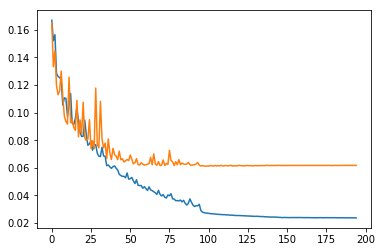

In [21]:
plt.plot(callback_list[1].history['train_loss'][5:])
plt.plot(callback_list[1].history['val_loss'][5:])

In [22]:
checkpoint = torch.load('../results/cnnnet/checkpoint-lr-scheduler.pth-best.tar')

## Loading the best model

In [23]:
from cpe775.utils.img_utils import show_landmarks_batch

In [24]:
best_model = Model(CNNNet((1, 256, 256), (68, 2)))
best_net = model.net
best_net.load_state_dict(checkpoint['state_dict'])

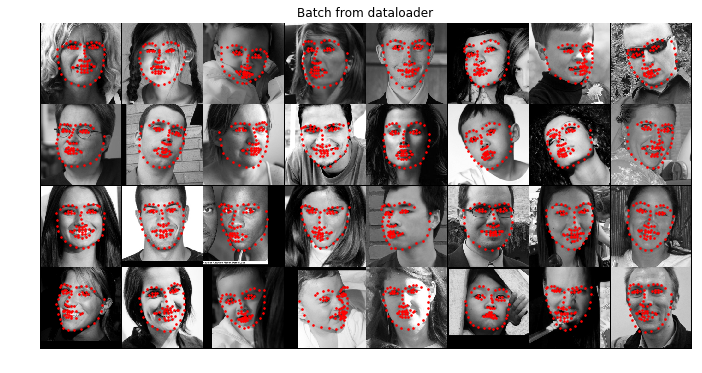

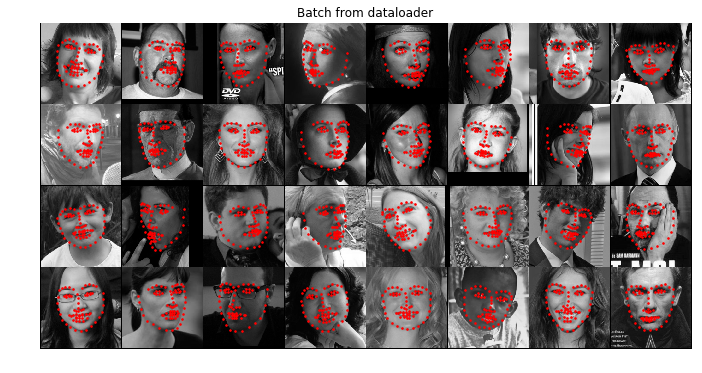

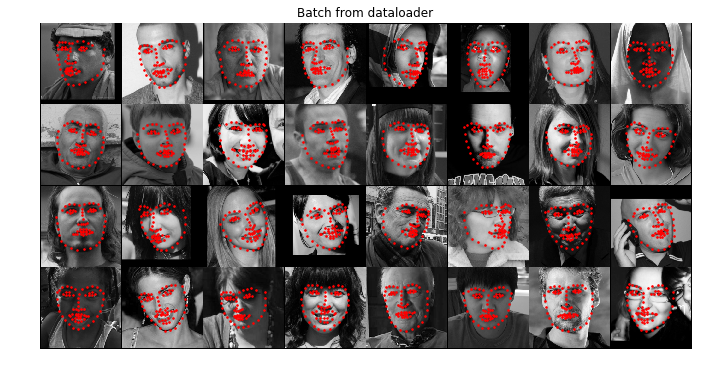

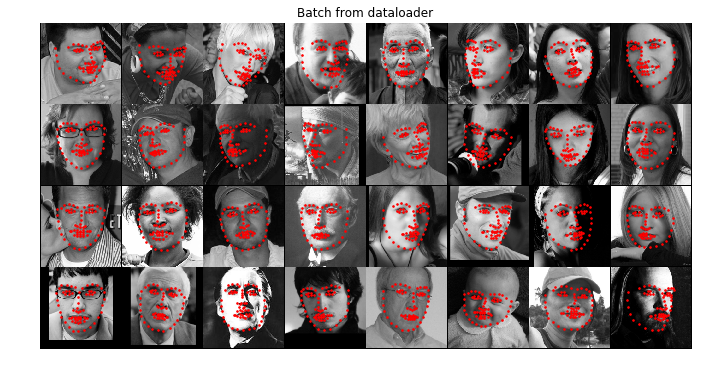

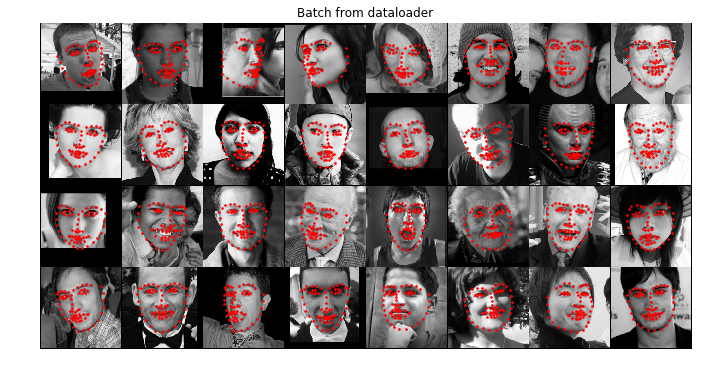

...

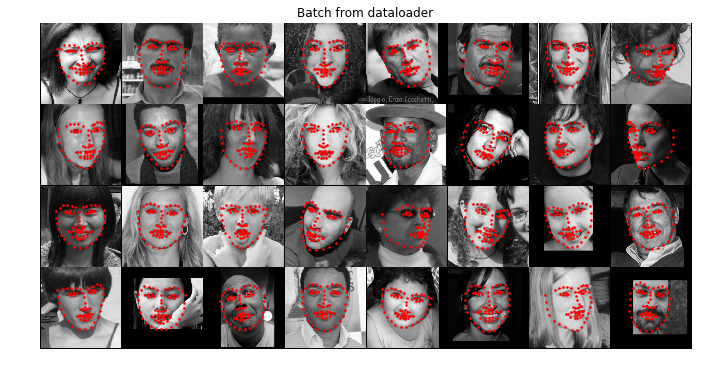

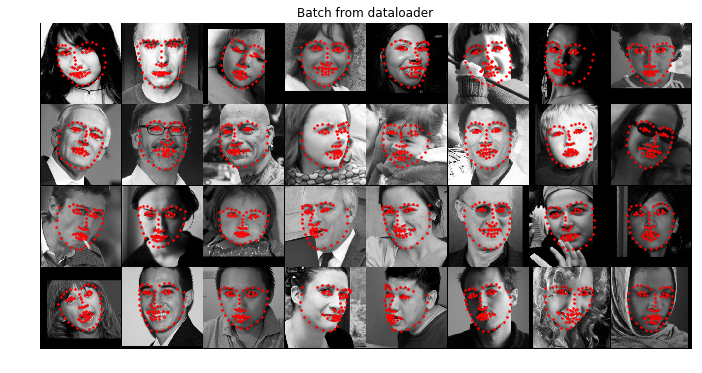

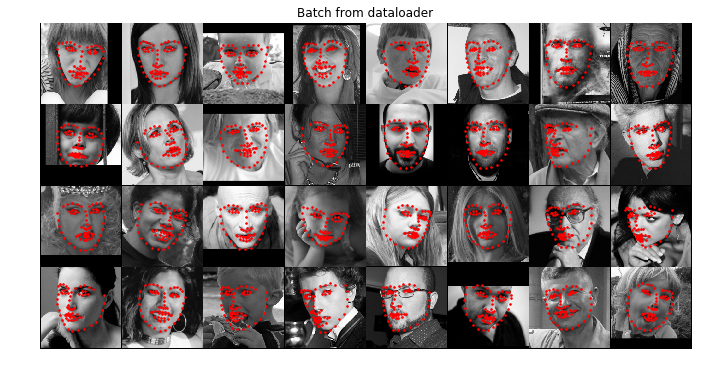

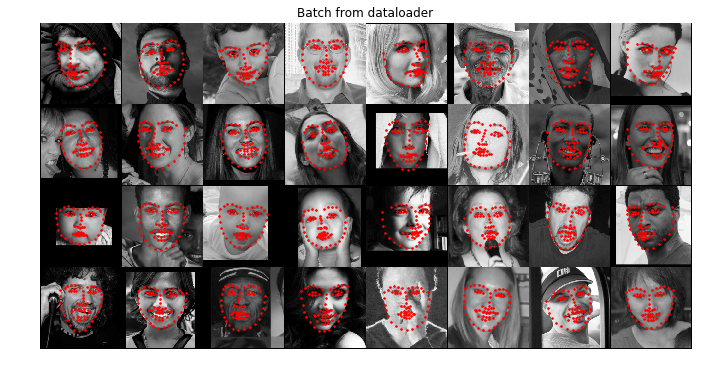

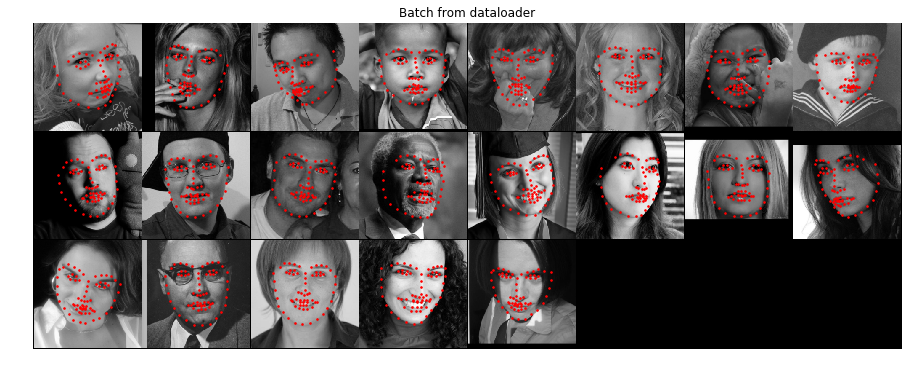

In [25]:
for i_batch, sample_batched in enumerate(valid_loader):
    
    predicted_landmarks = best_net(torch.autograd.Variable(sample_batched['image'], volatile=False)).cpu().data
    plt.figure(figsize=(20,6))
    show_landmarks_batch({'image': sample_batched['image'], 'landmarks': predicted_landmarks})
    plt.axis('off')
    plt.ioff()
    plt.show()

### Common test

In [26]:
# load the dataset
dataset = FaceLandmarksDataset(csv_file='../data/common_test.csv',
                               root_dir='../data/',
                               transform=transforms)

common_loader = torch.utils.data.DataLoader(dataset, 
                batch_size=batch_size, num_workers=4)

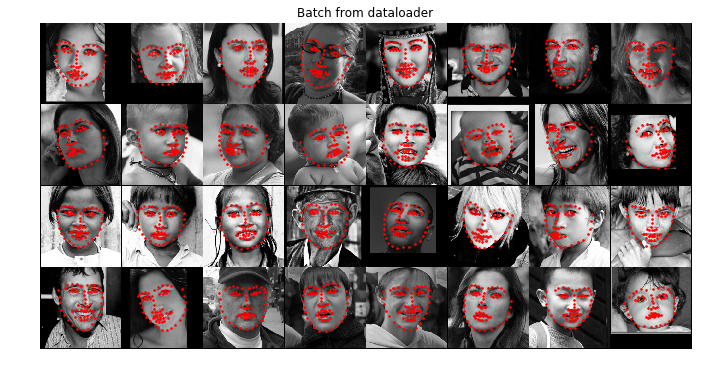

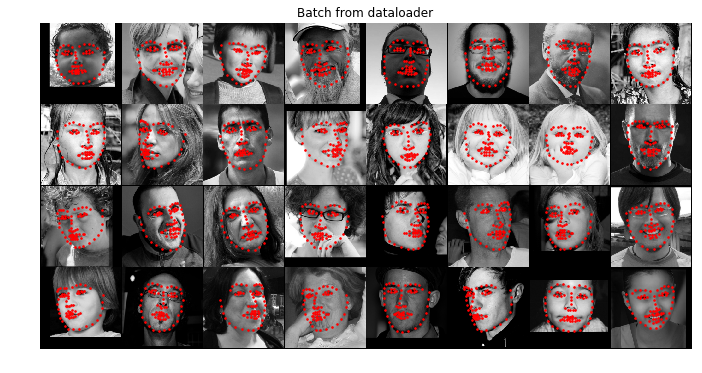

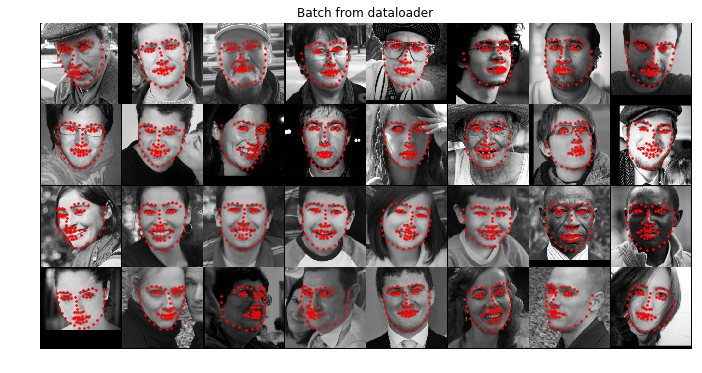

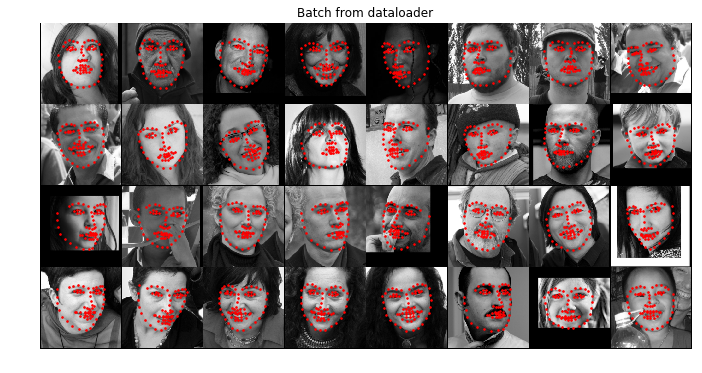

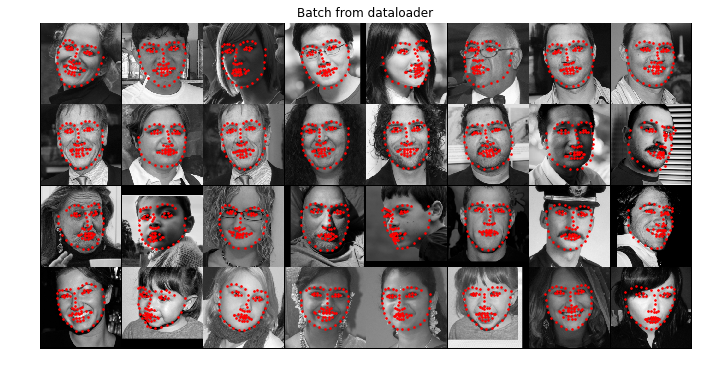

...

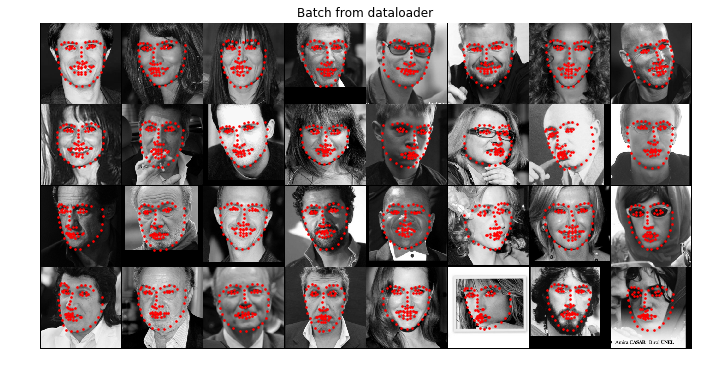

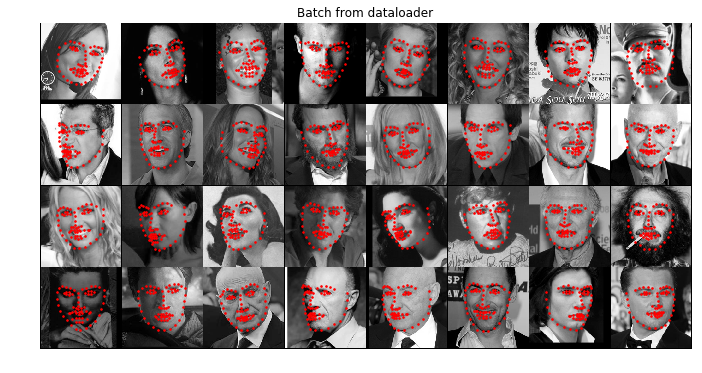

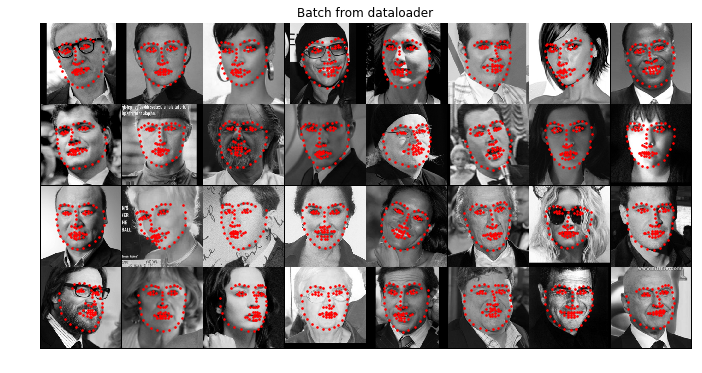

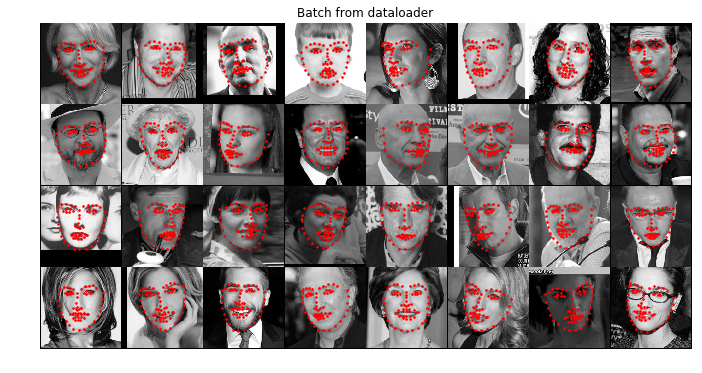

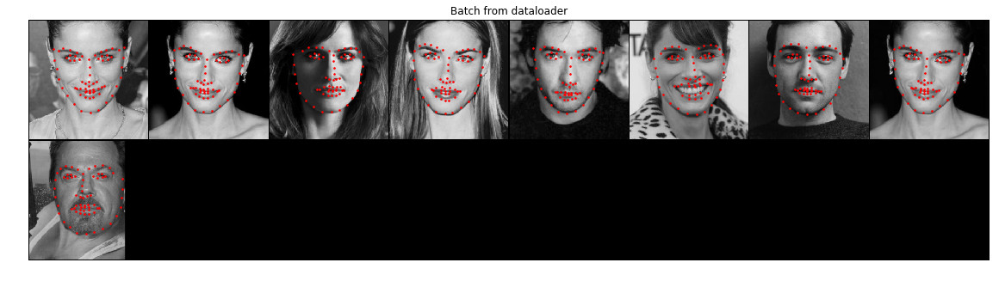

In [27]:
loss = 0
for i_batch, sample_batched in enumerate(common_loader):
    
    predicted_landmarks = best_net(torch.autograd.Variable(sample_batched['image'], volatile=False)).cpu().data
    
    loss += predicted_landmarks.shape[0]*criterion(predicted_landmarks, sample_batched['landmarks'])
    
    plt.figure(figsize=(20,6))
    show_landmarks_batch({'image': sample_batched['image'], 'landmarks': predicted_landmarks})
    plt.axis('off')
    plt.ioff()
    plt.show()

In [28]:
loss/len(dataset)

0.05684327234802043

### Challenging test

In [29]:
# load the dataset
challenging_set = FaceLandmarksDataset(csv_file='../data/challenging_test.csv',
                               root_dir='../data/',
                               transform=transforms)

challeging_loader = torch.utils.data.DataLoader(challenging_set, 
                batch_size=batch_size, num_workers=4)

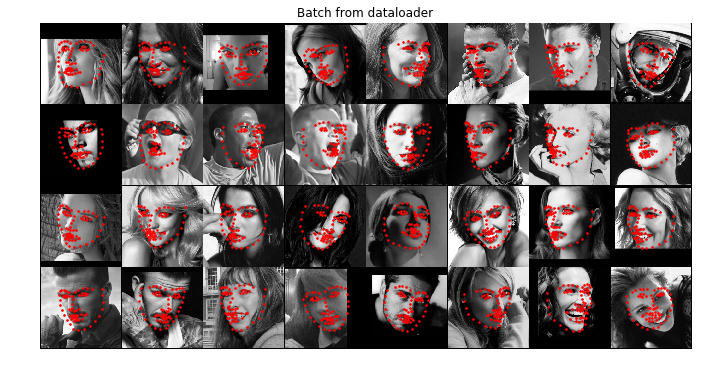

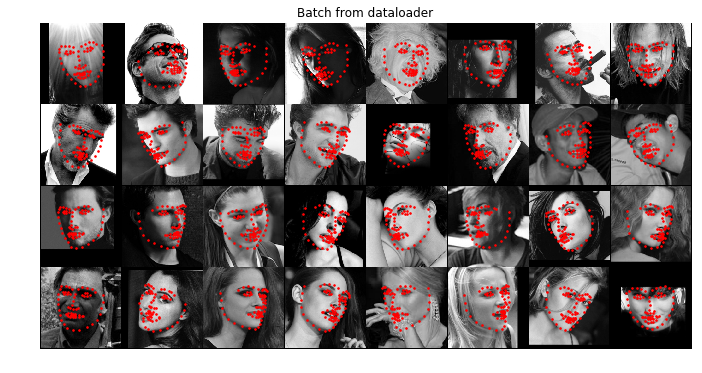

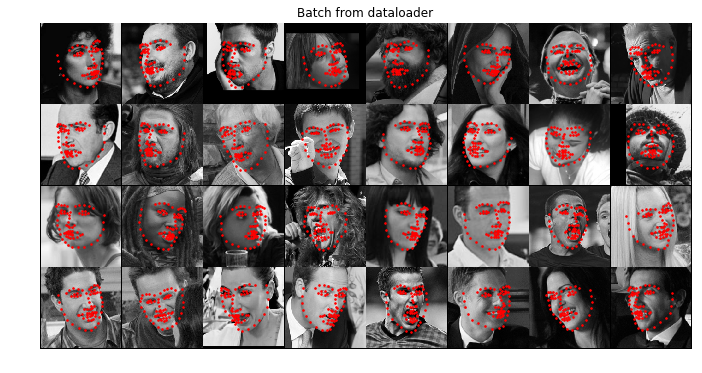

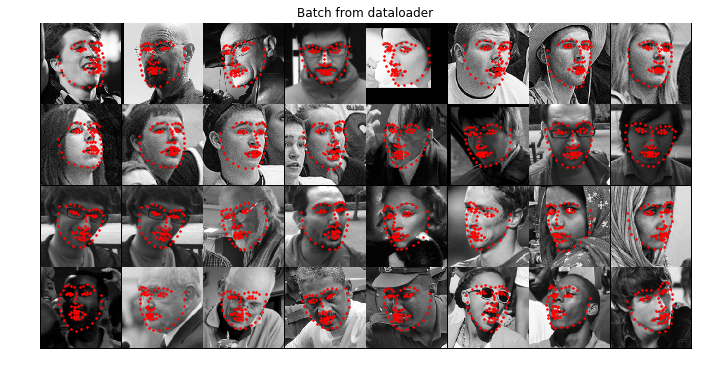

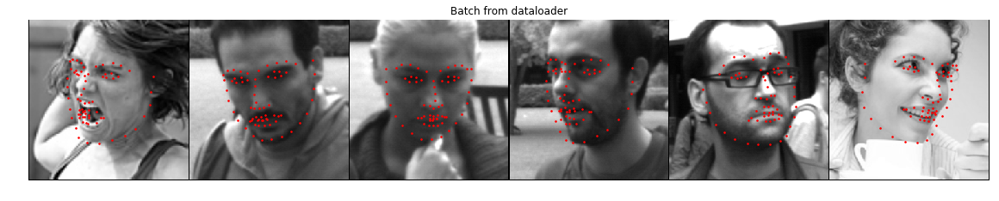

In [30]:
loss = 0
for i_batch, sample_batched in enumerate(challeging_loader):
    
    predicted_landmarks = best_net(torch.autograd.Variable(sample_batched['image'], volatile=False)).cpu().data
    
    loss += predicted_landmarks.shape[0]*criterion(predicted_landmarks, sample_batched['landmarks'])
    
    plt.figure(figsize=(20,6))
    show_landmarks_batch({'image': sample_batched['image'], 'landmarks': predicted_landmarks})
    plt.axis('off')
    plt.ioff()
    plt.show()

In [31]:
loss/len(challenging_set)

0.12504938444984492